In [ ]:
# Advanced Neural Networks on CIFAR-10 Dataset #

In [ ]:
# Increasing the Cell Width of Jupyter Notebook

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [ ]:
# Importing Libraries

import os
import torch
import shutil
import tarfile
import requests
import matplotlib
%matplotlib inline
import torchvision
import numpy as np
import pandas as pd
import PIL.ImageOps
from PIL import Image
import seaborn as sns
import torch.nn as nn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
from  torchvision import datasets
import torchvision.transforms as tt
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torch.utils.data import random_split
from torchvision.transforms import ToTensor
from torchvision.datasets import ImageFolder
from sklearn.metrics import confusion_matrix
from torchvision.datasets.utils import download_url
matplotlib.rcParams['figure.facecolor'] = '#ffffff'
plt.rcParams.update({'figure.max_open_warning': 0})

In [ ]:
# Dowloading the Dataset
dataset_url = "https://s3.amazonaws.com/fast-ai-imageclas/cifar10.tgz"
download_url(dataset_url, '.')

# Extracting Images from the Archive
data = "./data"
if os.path.exists(data):
    shutil.rmtree(data)
!mkdir ./data

#!unzip ./cifar100.zip -d ./data &> /dev/null

with tarfile.open('./cifar10.tgz', 'r:gz') as tar:
    tar.extractall(path='./data')


# Looking into the Data Directory
data_dir = './data/cifar10'
print(f"\n{os.listdir(data_dir)}")
print(f"{os.listdir(data_dir + '/train')}")

100%|██████████| 135107811/135107811 [00:10<00:00, 13292114.41it/s]



['train', 'test']
['deer', 'automobile', 'airplane', 'truck', 'ship', 'frog', 'horse', 'dog', 'cat', 'bird']


In [ ]:
# Defining the Function to Get Mean and Standard Deviation Values from the Training Dataset

def get_mean_std(loader):
    channels_sum, channels_squared_sum, num_batches = 0, 0, 0

    for data, _ in loader:
        channels_sum += torch.mean(data, dim=[0, 2, 3])
        channels_squared_sum += torch.mean(data ** 2, dim=[0, 2, 3])
        num_batches += 1

    mean = channels_sum / num_batches
    std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

    return tuple(mean.numpy()), tuple(std.numpy())

In [ ]:
# Calculating the Mean and Standard Deviation Values for the CIFAR-10 Dataset

dataset = ImageFolder(data_dir + '/train', transform=tt.ToTensor())
dataloader = DataLoader(dataset, batch_size=400, shuffle=True)
classes = dataset.classes

means, stds = get_mean_std(dataloader)
stats = (means, stds)
print(stats)

((0.49139974, 0.48215842, 0.44653103), (0.24703231, 0.2434852, 0.26158747))


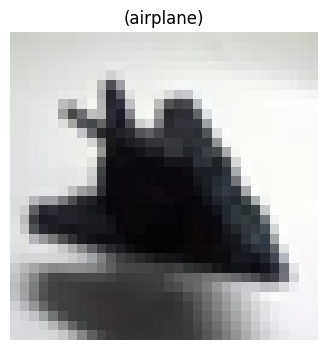

In [ ]:
# Plotting an Image from the Original Dataset

image, label = dataset[0]
plt.figure(figsize=(4, 4))
plt.axis('off')
plt.title(f"({classes[label]})")
plt.imshow(image.cpu().permute(1, 2, 0));

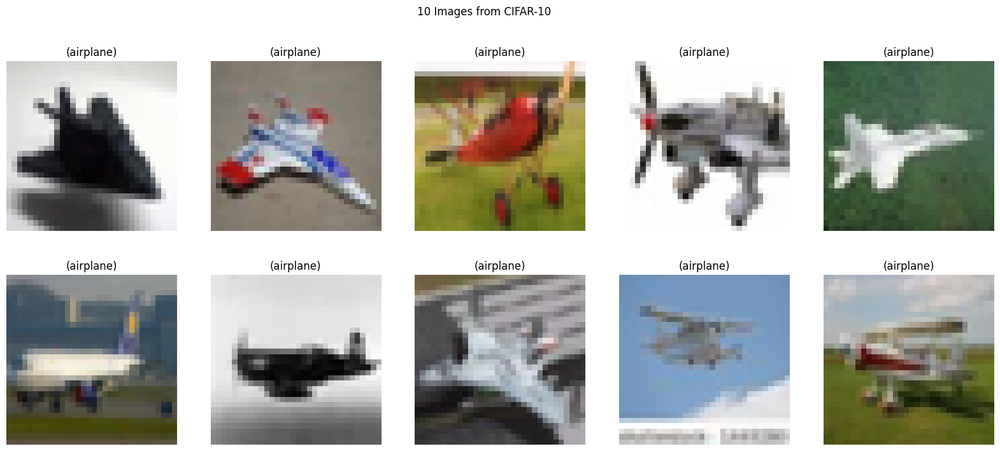

In [ ]:
# Plotting Multiple Images from the Original Dataset

cols = 5
rows = 2

fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 4, rows * 4))

for i, ax in enumerate(axs.flatten()):
    plt.sca(ax)
    image, label = dataset[i]
    plt.axis('off')
    plt.title(f"({classes[label]})")
    plt.imshow(image.cpu().permute(1, 2, 0));

plt.suptitle(f"{rows * cols} Images from CIFAR-10")
plt.show()

In [ ]:
# Splitting the Dataset into Training and Validation Datasets with Transformations (Validation Dataset will also Be Used as Testing Dataset)

train_tfms = tt.Compose([tt.Resize((32, 32)),
                         tt.RandomCrop(32, padding=4),
                         tt.RandomHorizontalFlip(),
                         tt.ToTensor(),
                         tt.Normalize(*stats, inplace=True)])

valid_tfms = tt.Compose([tt.Resize((32, 32)), tt.ToTensor(), tt.Normalize(*stats)])

train_ds = ImageFolder(data_dir + '/train', train_tfms)
valid_ds = ImageFolder(data_dir + '/test', valid_tfms)

In [ ]:
# Defining Data Loaders for the Training and Validation Datasets

batch_size = 400

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dl = DataLoader(valid_ds, int(batch_size * 2.5), num_workers=2, pin_memory=True)

In [ ]:
# Function to Eliminate Normalization Effects from Each Individual Data Sample (Image) for Visualization

def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1)
    return images.cpu() * stds + means

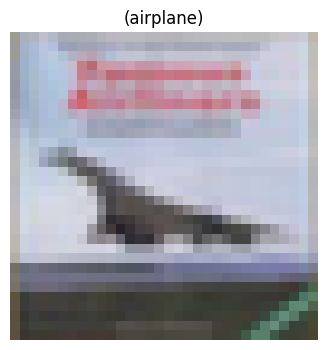

In [ ]:
# Plotting an Image from the Normalized Validation Dataset

image, label = valid_ds[0]
plt.figure(figsize=(4, 4))
plt.axis('off')
plt.title(f"({classes[label]})")
plt.imshow(denormalize(image, *stats).squeeze().permute(1, 2, 0));

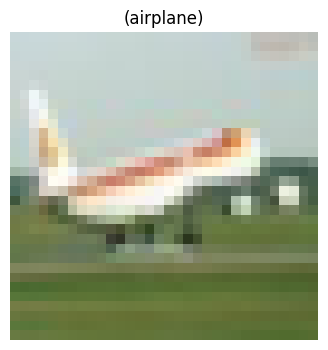

In [ ]:
# Plotting an Image from the Normalized Validation Data Loader

for images, labels in valid_dl:
    break

ind = 100
image = images[ind]
label = labels[ind]
plt.figure(figsize=(4, 4))
plt.axis('off')
plt.title(f"({classes[label]})")
plt.imshow(denormalize(image, *stats).squeeze().permute(1, 2, 0));

In [ ]:
# Function to Plot A Grid from One Batch of Images

def plot_batch(dataloader, x_size=25, y_size=16, denorm=True):
    for images, labels in dataloader:
        fig, ax = plt.subplots(figsize=(x_size, y_size))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(images, *stats)
        if denorm:
            ax.imshow(make_grid(denorm_images, nrow=x_size).permute(1, 2, 0).clamp(0, 1))
        else:
            ax.imshow(make_grid(images.cpu(), nrow=x_size).permute(1, 2, 0).clamp(0, 1))
        break

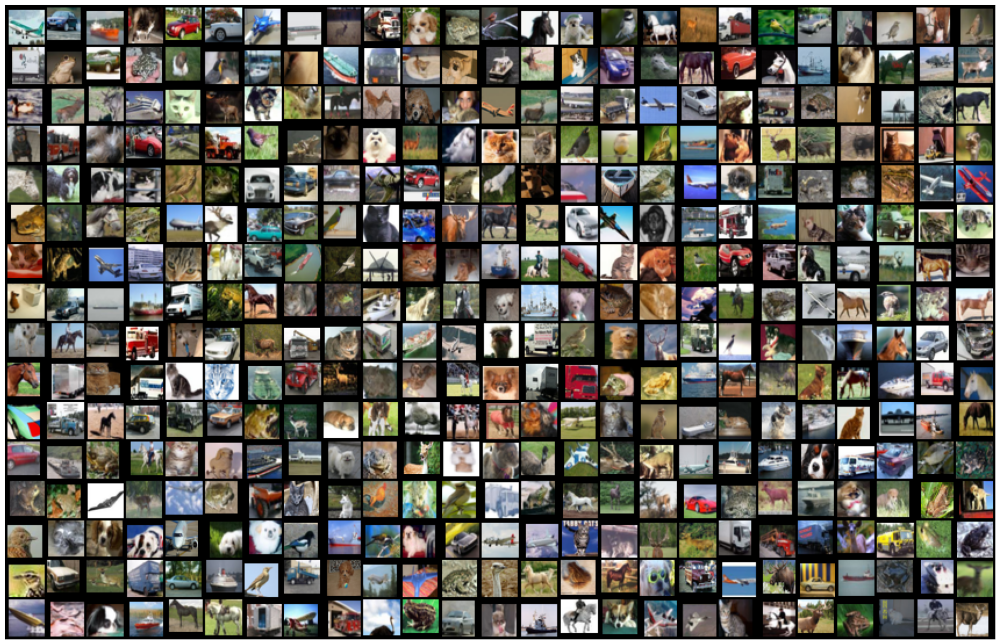

In [ ]:
# This Grid from the First Batch of the "train_dl" Contains a Mixture of Images from Different Classes Since the Training Set was Formed with the "Shuffle" Option

plot_batch(train_dl)

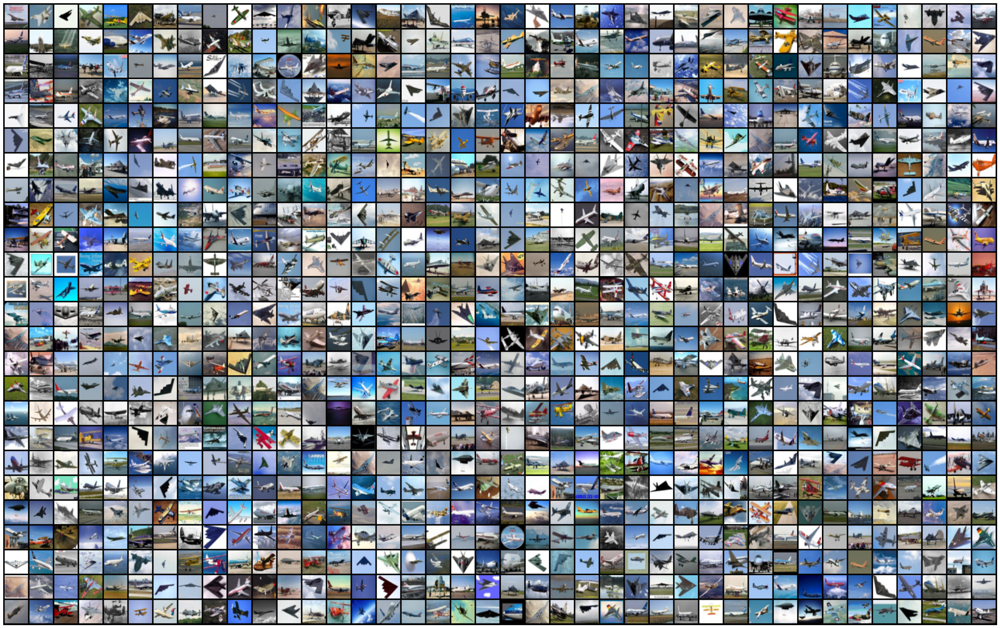

In [ ]:
# This Grid from the First Batch (1000) of the "valid_dl" Contains Images Only from the Same Class of 1000 Images Since the Validation Set was Not Formed with the "Shuffle" Option

plot_batch(valid_dl, x_size=40, y_size=25)

In [ ]:
# Defining a Useful Image Plotter Function for Data Loaders

def plot_image(img, denorm=True):
    plt.axis('off')
    if denorm:
        plt.imshow(denormalize(img, *stats).squeeze().permute(1, 2, 0).clamp(0, 1))
    else:
        plt.imshow(img.cpu().permute(1, 2, 0).clamp(0, 1))


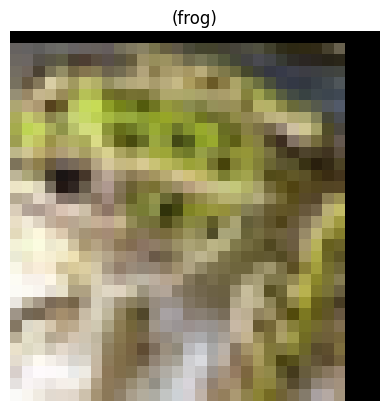

In [ ]:
# Plotting a Tensor Image from a Batch of the Normalized Training Data Loader by Using plot_image() Function

dataiter = iter(train_dl)
images, labels = next(dataiter)

ind = 300
plt.title(f"({classes[labels[ind]]})")
plot_image(images[ind])     # Automatic Denormalization (denorm=True) for the Normalized "train_dl <- train_ds"

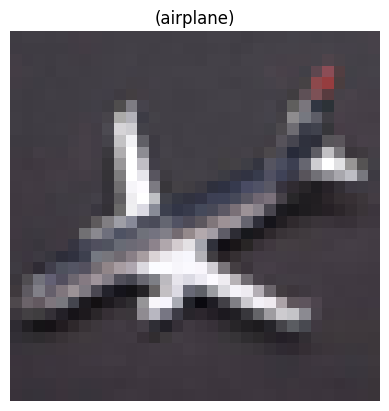

In [ ]:
# Plotting a Tensor Image from the Original Dataset without Denormalization

ind = 350
image, label = dataset[ind]
plt.title(f"({classes[label]})")
plot_image(image, denorm=False)   # No Denormalization for the Original "dataset"

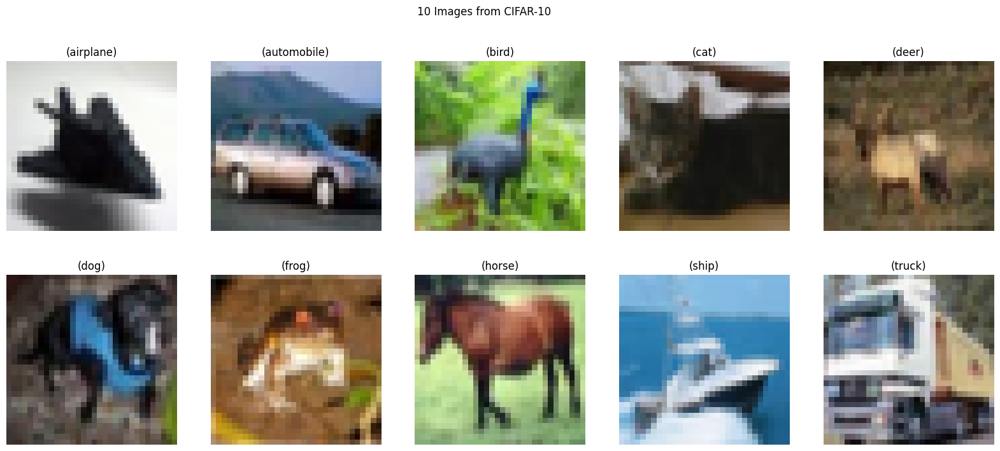

In [ ]:
# Plotting Multiple Images from the Original Dataset

cols = 5
rows = 2

fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 4, rows * 4))

for i, ax in enumerate(axs.flatten()):
    ind = 5000 * i
    plt.sca(ax)
    image, label = dataset[ind]
    ax.set_title(f"({classes[label]})")
    plot_image(image, denorm=False)

plt.suptitle(f"{rows * cols} Images from CIFAR-10")
plt.show()

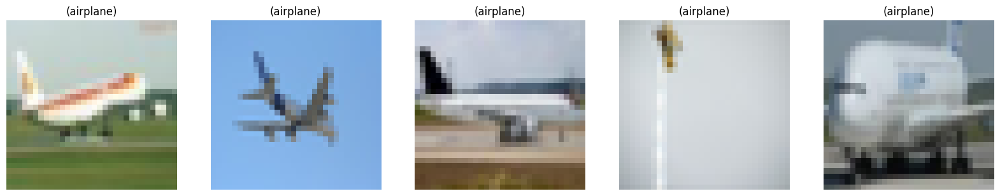

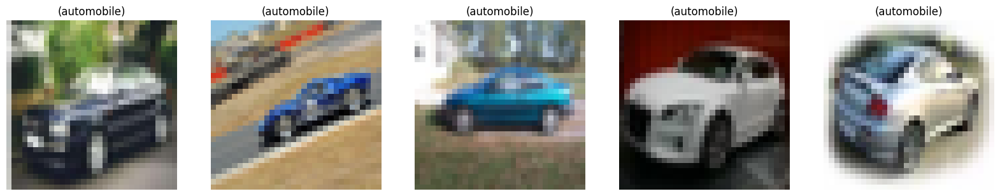

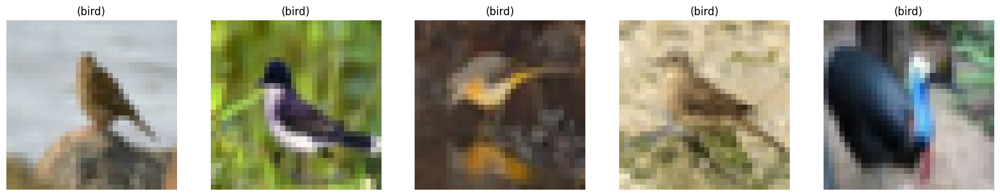

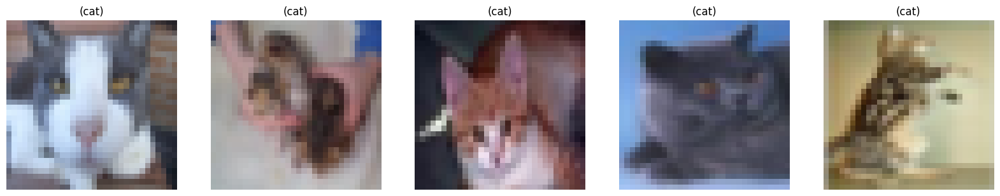

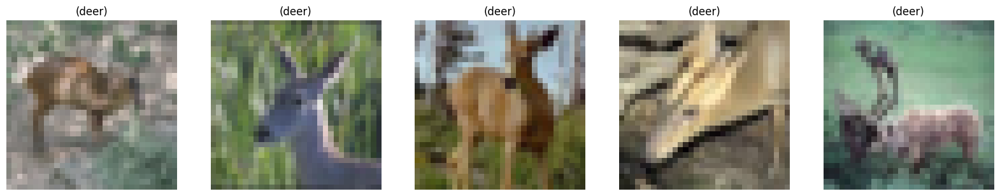

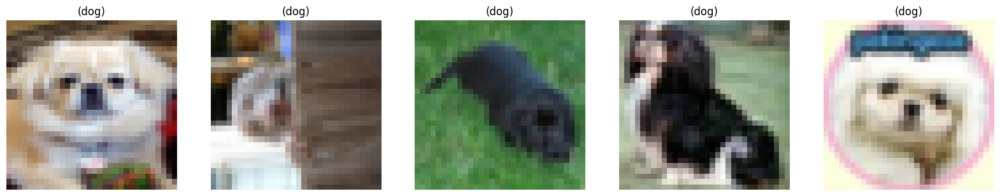

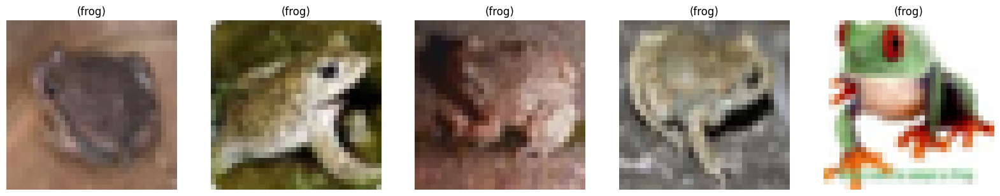

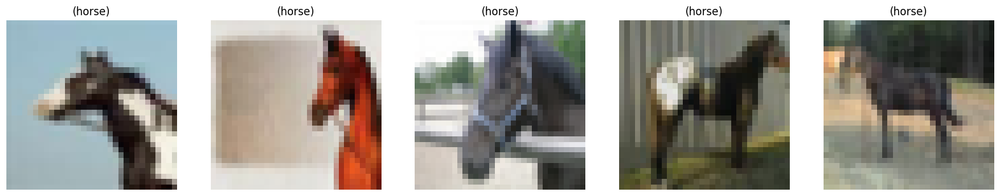

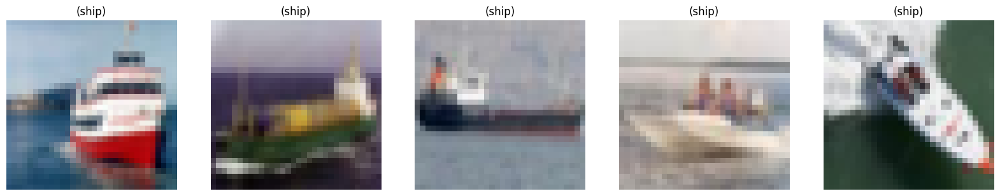

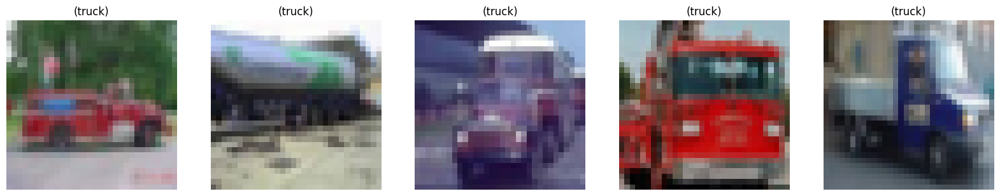

In [ ]:
# Plotting 5 Rows from Each Batch (1000 Images) which Results in Showing 5 Images per Each Class (10)

cols = 5
rows = 1

for images, labels in valid_dl:

    fig = plt.figure(figsize=(cols * 4, rows * 4))

    for idx in np.arange(rows * cols):
        ax = fig.add_subplot(rows, cols, idx+1, xticks=[], yticks=[])
        idx = 200 * idx + 100
        ax.set_title(f"({classes[labels[idx]]})")
        plot_image(images[idx])               # "denorm=True" by Default

In [ ]:
#######################################
### Defining Functions for CIFAR-10 ###
#######################################

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))


class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate Predictions
        loss = F.cross_entropy(out, labels)   # Evaluate Loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate Predictions
        loss = F.cross_entropy(out, labels)   # Evaluate Loss
        acc = accuracy(out, labels)           # Evaluate Accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine Losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine Accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, epochs, result):
        print("Epoch [{}/{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch+1, epochs, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc']))

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in tqdm(val_loader, desc=f"Evaluation")]
    return model.validation_epoch_end(outputs)


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader,
                  weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []

    # Set up Cutom Optimizer with Weight Decay
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # Set up One-Cycle Learning Rate Scheduler
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))

    for epoch in range(epochs):
        # Training Phase
        model.train()
        train_losses = []
        lrs = []
        for batch in tqdm(train_loader, desc=f"Epoch [{epoch + 1}/{epochs}]"):
            optimizer.zero_grad()
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # Gradient Clipping
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()

            # Record & update learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, epochs, result)
        history.append(result)
    return history

In [ ]:
# Definition of Device Loader Functions to Send Data Loaders and the Model to the Current Device (GPU) Before Training

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)


class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
# ResNet9 Model

def conv_block(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
              nn.BatchNorm2d(out_channels),
              nn.ReLU(inplace=True)]
    if pool: layers.append(nn.MaxPool2d(2))
    return nn.Sequential(*layers)


class ResNet9(ImageClassificationBase):
    def __init__(self, in_channels, num_classes):
        super().__init__()

        self.conv1 = conv_block(in_channels, 64)
        self.conv2 = conv_block(64, 128, pool=True)
        self.res1 = nn.Sequential(conv_block(128, 128), conv_block(128, 128))

        self.conv3 = conv_block(128, 256, pool=True)
        self.conv4 = conv_block(256, 512, pool=True)
        self.res2 = nn.Sequential(conv_block(512, 512), conv_block(512, 512))

        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                        nn.Flatten(),
                                        nn.Dropout(0.3),
                                        nn.Linear(512, num_classes))

    def forward(self, xb):
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

In [ ]:
# Re-Defining Transforms, Datasets and Data Loaders, Creating the Model and Sending Them All to the Current Device

train_tfms = tt.Compose([tt.Resize((32, 32)),
                         tt.RandomCrop(32, padding=4),
                         tt.RandomHorizontalFlip(),
                         tt.ToTensor(),
                         tt.Normalize(*stats, inplace=True)])

valid_tfms = tt.Compose([tt.Resize((32, 32)), tt.ToTensor(), tt.Normalize(*stats)])

train_ds = ImageFolder(data_dir + '/train', train_tfms)
valid_ds = ImageFolder(data_dir + '/test', valid_tfms)

####################################################

batch_size = 400

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dl = DataLoader(valid_ds, int(batch_size * 2.5), num_workers=2, pin_memory=True)
model = ResNet9(3, 10)

####################################################

train_dl = DeviceDataLoader(train_dl, device)
valid_dl = DeviceDataLoader(valid_dl, device)
model = to_device(model, device)

####################################################

print(f"train_dl.device: {train_dl.device}")
print(f"valid_dl.device: {valid_dl.device}")
if next(model.parameters()).is_cuda:
    print(f"model.device   : cuda")
else:
    print(f"model.device   : cpu")

train_dl.device: cuda
valid_dl.device: cuda
model.device   : cuda


In [ ]:
# Evaluation of the Model with Validation Dataset Before Training

result = evaluate(model, valid_dl)
print(result)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 2.304243803024292, 'val_acc': 0.09669999778270721}


In [ ]:
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [ ]:
%%time
epochs = 50
max_lr = 0.01
history = fit_one_cycle(epochs, max_lr, model,
                        train_dl, valid_dl,
                        grad_clip=grad_clip,
                        weight_decay=weight_decay,
                        opt_func=opt_func)

Epoch [1/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/50], last_lr: 0.00050, train_loss: 1.7200, val_loss: 1.3247, val_acc: 0.5431


Epoch [2/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [2/50], last_lr: 0.00081, train_loss: 1.1669, val_loss: 1.1312, val_acc: 0.6095


Epoch [3/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [3/50], last_lr: 0.00131, train_loss: 0.9079, val_loss: 0.9164, val_acc: 0.6880


Epoch [4/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [4/50], last_lr: 0.00198, train_loss: 0.7641, val_loss: 1.0759, val_acc: 0.6637


Epoch [5/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [5/50], last_lr: 0.00280, train_loss: 0.6878, val_loss: 0.8520, val_acc: 0.7311


Epoch [6/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [6/50], last_lr: 0.00371, train_loss: 0.6263, val_loss: 0.7770, val_acc: 0.7363


Epoch [7/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [7/50], last_lr: 0.00469, train_loss: 0.5848, val_loss: 0.5819, val_acc: 0.8113


Epoch [8/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [8/50], last_lr: 0.00570, train_loss: 0.5430, val_loss: 0.7711, val_acc: 0.7619


Epoch [9/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [9/50], last_lr: 0.00668, train_loss: 0.4975, val_loss: 1.0205, val_acc: 0.6906


Epoch [10/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [10/50], last_lr: 0.00760, train_loss: 0.4686, val_loss: 0.9711, val_acc: 0.7082


Epoch [11/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [11/50], last_lr: 0.00841, train_loss: 0.4587, val_loss: 0.6855, val_acc: 0.7668


Epoch [12/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [12/50], last_lr: 0.00908, train_loss: 0.4473, val_loss: 0.4897, val_acc: 0.8347


Epoch [13/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [13/50], last_lr: 0.00958, train_loss: 0.4210, val_loss: 0.5193, val_acc: 0.8259


Epoch [14/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [14/50], last_lr: 0.00989, train_loss: 0.4164, val_loss: 0.6456, val_acc: 0.7936


Epoch [15/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [15/50], last_lr: 0.01000, train_loss: 0.4238, val_loss: 0.5922, val_acc: 0.7984


Epoch [16/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [16/50], last_lr: 0.00998, train_loss: 0.3999, val_loss: 0.7004, val_acc: 0.7762


Epoch [17/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [17/50], last_lr: 0.00992, train_loss: 0.4082, val_loss: 0.6190, val_acc: 0.8036


Epoch [18/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [18/50], last_lr: 0.00982, train_loss: 0.4022, val_loss: 0.5901, val_acc: 0.8078


Epoch [19/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [19/50], last_lr: 0.00968, train_loss: 0.3866, val_loss: 0.5797, val_acc: 0.8185


Epoch [20/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [20/50], last_lr: 0.00950, train_loss: 0.3876, val_loss: 0.7535, val_acc: 0.7602


Epoch [21/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [21/50], last_lr: 0.00929, train_loss: 0.3834, val_loss: 0.4748, val_acc: 0.8449


Epoch [22/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [22/50], last_lr: 0.00905, train_loss: 0.3762, val_loss: 0.7034, val_acc: 0.7758


Epoch [23/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [23/50], last_lr: 0.00877, train_loss: 0.3750, val_loss: 0.5963, val_acc: 0.8139


Epoch [24/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [24/50], last_lr: 0.00846, train_loss: 0.3692, val_loss: 0.7155, val_acc: 0.7785


Epoch [25/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [25/50], last_lr: 0.00812, train_loss: 0.3602, val_loss: 0.5149, val_acc: 0.8289


Epoch [26/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [26/50], last_lr: 0.00775, train_loss: 0.3525, val_loss: 0.4757, val_acc: 0.8398


Epoch [27/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [27/50], last_lr: 0.00737, train_loss: 0.3446, val_loss: 0.6659, val_acc: 0.7863


Epoch [28/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [28/50], last_lr: 0.00697, train_loss: 0.3352, val_loss: 0.5973, val_acc: 0.8021


Epoch [29/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [29/50], last_lr: 0.00655, train_loss: 0.3259, val_loss: 0.5137, val_acc: 0.8296


Epoch [30/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [30/50], last_lr: 0.00611, train_loss: 0.3179, val_loss: 0.5719, val_acc: 0.8131


Epoch [31/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [31/50], last_lr: 0.00567, train_loss: 0.3069, val_loss: 0.4557, val_acc: 0.8530


Epoch [32/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [32/50], last_lr: 0.00522, train_loss: 0.2905, val_loss: 0.4028, val_acc: 0.8627


Epoch [33/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [33/50], last_lr: 0.00478, train_loss: 0.2770, val_loss: 0.5362, val_acc: 0.8270


Epoch [34/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [34/50], last_lr: 0.00433, train_loss: 0.2605, val_loss: 0.5168, val_acc: 0.8483


Epoch [35/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [35/50], last_lr: 0.00389, train_loss: 0.2434, val_loss: 0.3800, val_acc: 0.8735


Epoch [36/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [36/50], last_lr: 0.00345, train_loss: 0.2259, val_loss: 0.3571, val_acc: 0.8848


Epoch [37/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [37/50], last_lr: 0.00303, train_loss: 0.2052, val_loss: 0.3646, val_acc: 0.8874


Epoch [38/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [38/50], last_lr: 0.00263, train_loss: 0.1931, val_loss: 0.3551, val_acc: 0.8880


Epoch [39/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [39/50], last_lr: 0.00225, train_loss: 0.1701, val_loss: 0.3419, val_acc: 0.8971


Epoch [40/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [40/50], last_lr: 0.00188, train_loss: 0.1441, val_loss: 0.3188, val_acc: 0.9014


Epoch [41/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [41/50], last_lr: 0.00154, train_loss: 0.1262, val_loss: 0.3049, val_acc: 0.9073


Epoch [42/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [42/50], last_lr: 0.00123, train_loss: 0.1071, val_loss: 0.2828, val_acc: 0.9162


Epoch [43/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [43/50], last_lr: 0.00095, train_loss: 0.0855, val_loss: 0.2681, val_acc: 0.9213


Epoch [44/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [44/50], last_lr: 0.00071, train_loss: 0.0666, val_loss: 0.2637, val_acc: 0.9250


Epoch [45/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [45/50], last_lr: 0.00050, train_loss: 0.0531, val_loss: 0.2644, val_acc: 0.9275


Epoch [46/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [46/50], last_lr: 0.00032, train_loss: 0.0418, val_loss: 0.2662, val_acc: 0.9289


Epoch [47/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [47/50], last_lr: 0.00018, train_loss: 0.0362, val_loss: 0.2597, val_acc: 0.9304


Epoch [48/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [48/50], last_lr: 0.00008, train_loss: 0.0304, val_loss: 0.2601, val_acc: 0.9300


Epoch [49/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [49/50], last_lr: 0.00002, train_loss: 0.0273, val_loss: 0.2588, val_acc: 0.9305


Epoch [50/50]:   0%|          | 0/125 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [50/50], last_lr: 0.00000, train_loss: 0.0260, val_loss: 0.2620, val_acc: 0.9304
CPU times: user 9min 8s, sys: 8min 28s, total: 17min 37s
Wall time: 19min 58s


In [ ]:
# Evaluation of the Model with Validation Set After Training

result = evaluate(model, valid_dl)
print(result)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 0.2619624137878418, 'val_acc': 0.930400013923645}


In [ ]:
# Functions for Plotting Accuracy and Loss History

def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');


def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

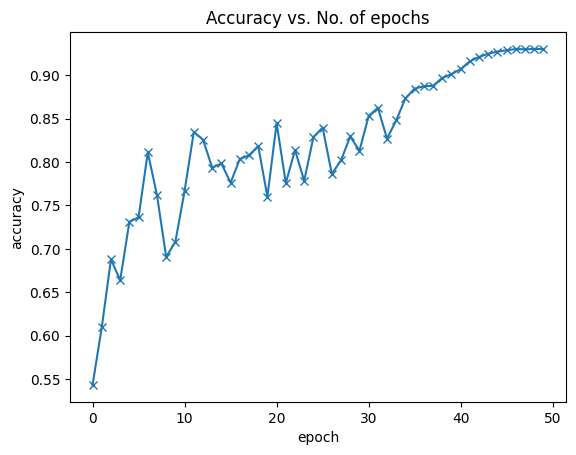

In [ ]:
plot_accuracies(history)

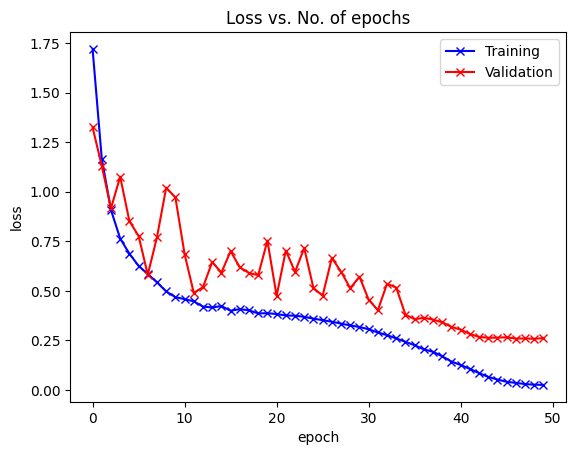

In [ ]:
plot_losses(history)

In [ ]:
# Overfitting is Reduced

In [ ]:
# Function for Plotting Learning Rate Changes

def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');

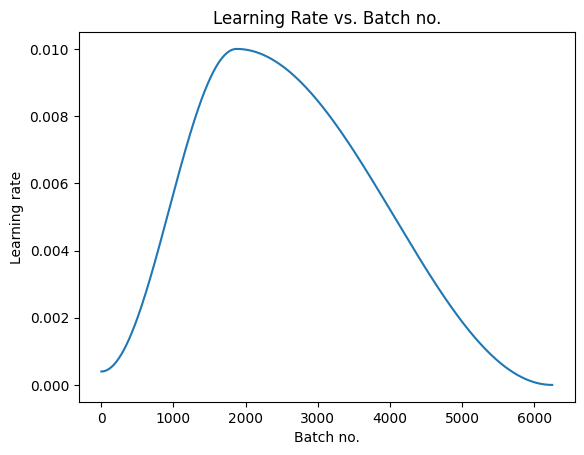

In [ ]:
plot_lrs(history)

In [ ]:
def predict_image(img, model):
    # Convert Image Tensor to a Batch of 1
    xb = img.unsqueeze(0)
    # Get Predictions from the Model
    yb = model(xb)
    # Pick Index with the Highest Probability
    _, preds  = torch.max(yb, dim=1)
    # Return the Class Index
    return preds.item()

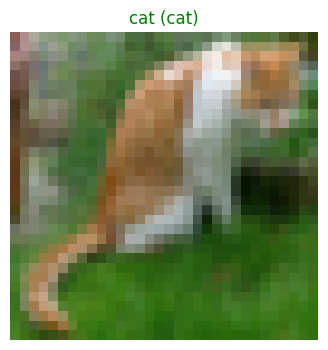

In [ ]:
# Plotting a Tensor Image from the Normalized Validation Dataset by Using plot_image() Function

image, label = valid_ds[3400]        # Normalized Validation Dataset
image = to_device(image, device)
plt.figure(figsize=(4, 4))
plt.axis('off')
label = classes[label]
pred = classes[predict_image(image, model)]   # Predict from Normalized Data
plt.title(f"{pred} ({label})", color=("green" if pred==label else "red"))
plot_image(image);      # Denormalization is Active by Default (denorm=True)

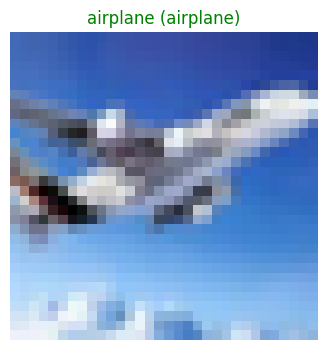

In [ ]:
# Plotting a Tensor Image from the Normalized Validation Data Loader by Using plot_image() Function

dataiter = iter(valid_dl)
images, labels = next(dataiter)   # Containing 1 Batch (1000) of Validation Data

ind = 45
plt.figure(figsize=(4, 4))
plt.axis('off')
label = classes[labels[ind]]    # Get True Label Name
pred = classes[predict_image(images[ind], model)]   # Get Predicted Label Name
plt.title(f"{pred} ({label})", color=("green" if pred==label else "red"))
plot_image(images[ind]);    # Denormalization is Active by Default (denorm=True)

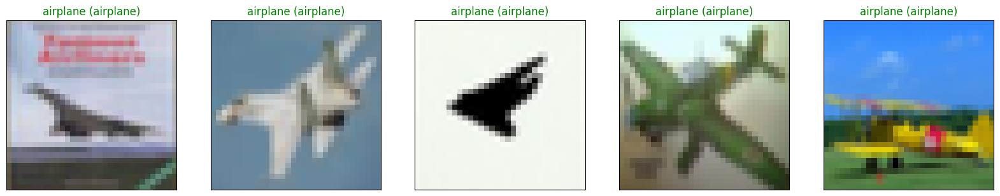

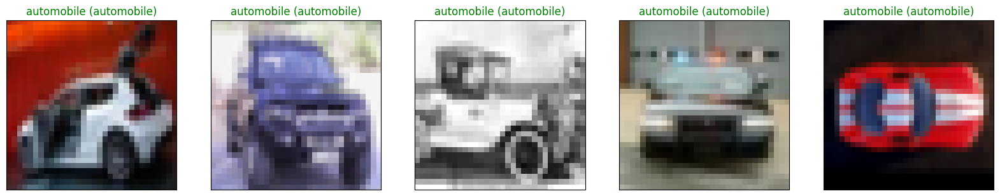

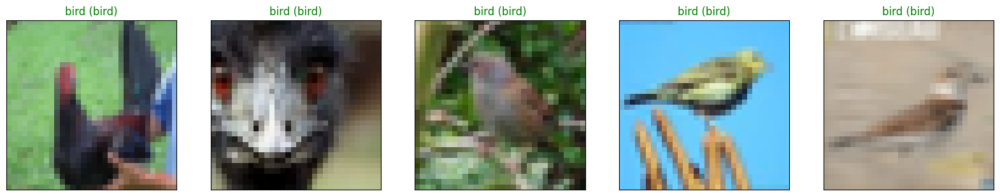

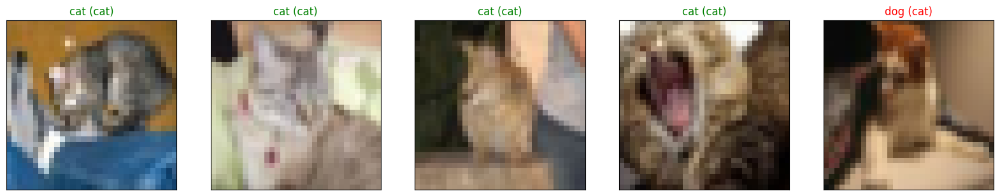

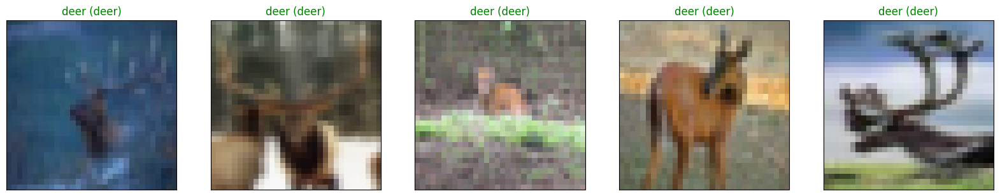

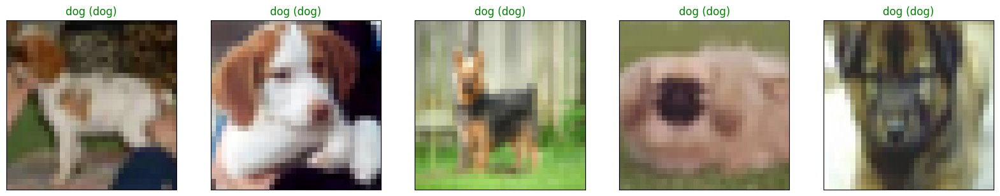

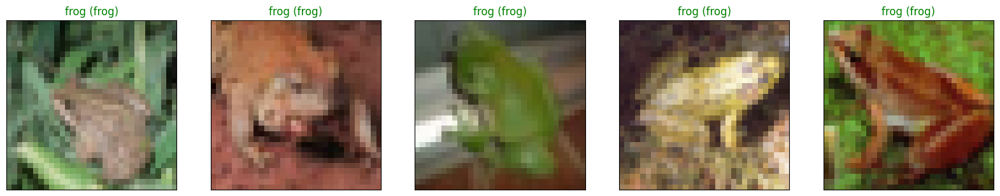

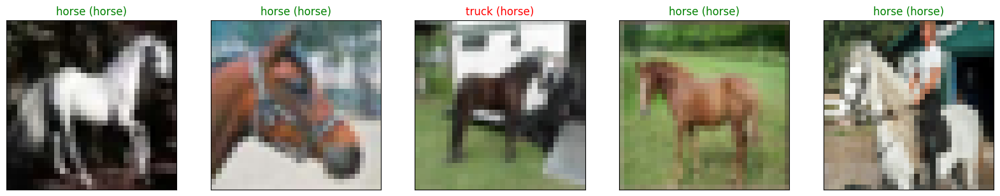

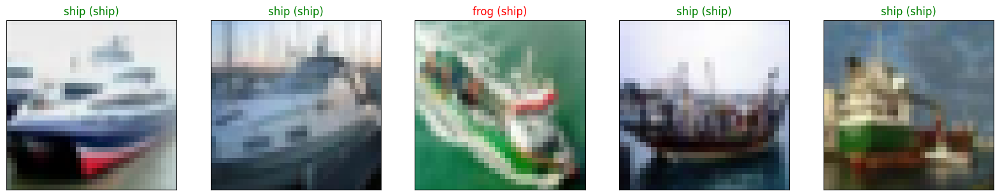

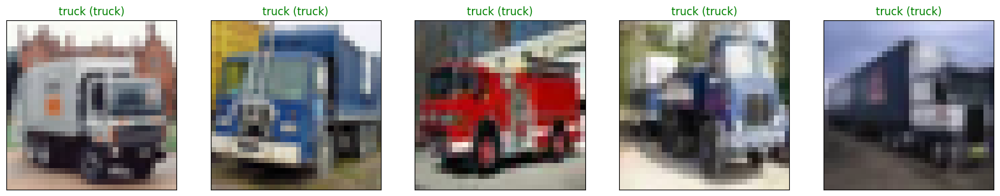

In [ ]:
# Getting Images & Labels from One Batch and Predicting Their Labels

i = 0
# Getting Images & Labels from Different Batches
for images, labels in valid_dl:

    #images = images.to(device)   # Not Necessary, valid_loader is Already in Device
    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    col = 5
    row = 1     # Get 1 Row from Each Batch

    fig = plt.figure(figsize=(col * 4, row * 4))

    for idx in np.arange(row * col):
        ax = fig.add_subplot(row, col, idx+1, xticks=[], yticks=[])
        pred = classes[preds[idx].item()]
        label = classes[labels[idx].item()]
        ax.set_title("{} ({})".format(str(pred), str(label)), color=("green" if pred==label else "red"))
        plt.imshow(denormalize(images[idx], *stats).squeeze().permute(1, 2, 0));

    i += 1
    if i == 10:
        break   # Get 1 Row From 10 Different Batches

Making Predictions:   0%|          | 0/10 [00:00<?, ?it/s]

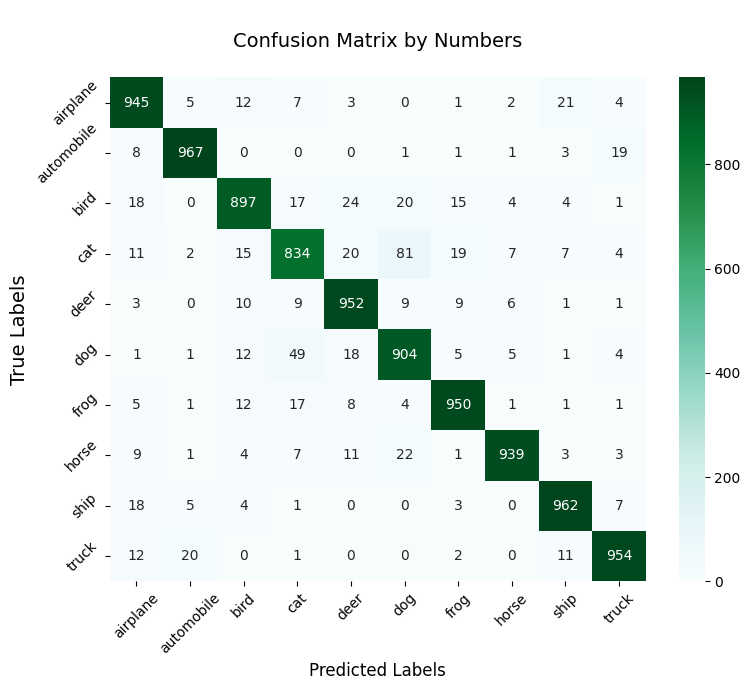

In [ ]:
# Confusion Matrix by Numbers

y_pred = []
y_true = []

model.eval()
with torch.no_grad():
    for inputs, labels in tqdm(valid_dl, desc="Making Predictions"):
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_pred.extend(preds.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# Calculating Confusion Matrix
cf_matrix = confusion_matrix(y_true, y_pred)

class_names = []
for i in range(10):
    class_names.append(classes[i])

df_cm_n = pd.DataFrame(cf_matrix, class_names, class_names)

plt.figure(figsize=(8, 7))
sns.heatmap(df_cm_n, annot=True, cmap="BuGn", fmt='g')
plt.title("\nConfusion Matrix by Numbers\n", fontsize=14)
plt.ylabel("True Labels", fontsize=14)
plt.xlabel("Predicted Labels", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

Making Predictions:   0%|          | 0/10 [00:00<?, ?it/s]

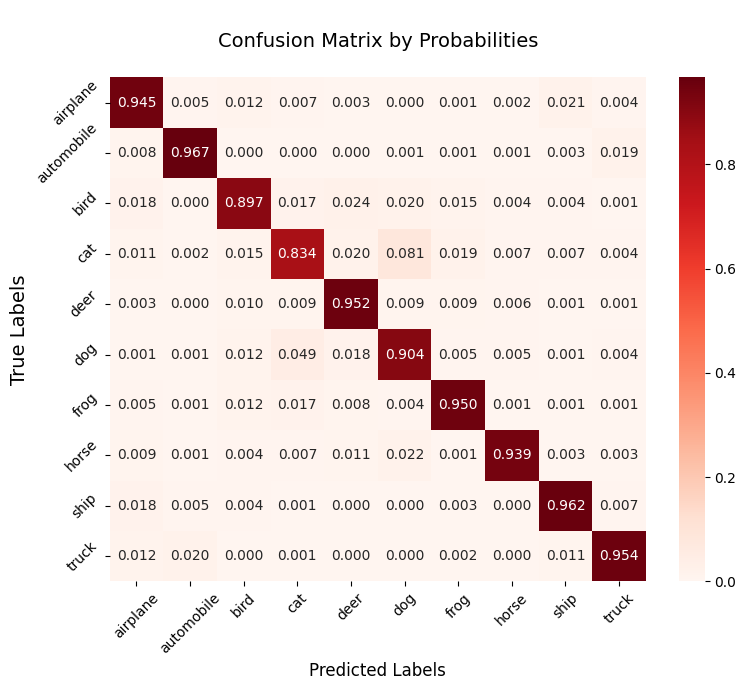

In [ ]:
# Confusion Matrix by Probabilities

y_pred = []
y_true = []

model.eval()
with torch.no_grad():
    for inputs, labels in tqdm(valid_dl, desc="Making Predictions"):
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_pred.extend(preds.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# Calculating Confusion Matrix
cf_matrix = confusion_matrix(y_true, y_pred)

class_names = []
for i in range(10):
    class_names.append(classes[i])

df_cm_p = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], class_names, class_names)

plt.figure(figsize=(8, 7))
sns.heatmap(df_cm_p, annot=True, cmap='Reds', fmt=".3f")
plt.title("\nConfusion Matrix by Probabilities\n", fontsize=14)
plt.ylabel("True Labels", fontsize=14)
plt.xlabel("Predicted Labels", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
result = evaluate(model, valid_dl)
print(result)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 0.2619624137878418, 'val_acc': 0.930400013923645}


In [ ]:
# Using the Trained Model for Batch Loading from test_loader

model.eval()
with torch.no_grad():
    for images, labels in valid_dl:  # valid_dl is Already in Device
        outputs = model(images)
        break

print(f"Sample Outputs:\n{outputs[:1].data}")

Sample Outputs:
tensor([[ 8.3005, -1.6270,  2.6246, -3.2307, -2.7603, -4.5313, -3.8589, -2.9423,
          3.1924, -1.2816]], device='cuda:0')


In [ ]:
# Applying Softmax() for Each Output Row
probs = nn.Softmax(dim=1)(outputs)
#probs = F.softmax(outputs, dim=1)

# Looking at Sample Probabilities
print("Sample Probabilities:\n", probs[:1].data)

# Adding up the Probabilities of an Output Row
print("\nSum of probs[0]:", torch.sum(probs[:1]).item())

Sample Probabilities:
 tensor([[9.9045e-01, 4.8350e-05, 3.3949e-03, 9.7251e-06, 1.5567e-05, 2.6489e-06,
         5.1889e-06, 1.2976e-05, 5.9899e-03, 6.8298e-05]], device='cuda:0')

Sum of probs[0]: 0.9999998807907104


In [ ]:
# Analysis of Truth Labels & Predicted Labels

max_probs, preds = torch.max(probs, dim=1)
print(f"Labels:\n{labels}\n")
print(f"Predictions:\n{preds}\n")
print(f"Differences:\n{preds-labels}\n")
print(f"Max Probabilities:\n{max_probs}")

Labels:
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
# Simple Accuracy Calculation

print(f"Only True Predictions ------------ : {torch.sum(preds == labels).item()}")
print(f"All the Predictions in a Batch --- : {len(preds)}")
print(f"Probability of the True Predictions: {torch.sum(preds == labels).item() / len(preds)}")

Only True Predictions ------------ : 945
All the Predictions in a Batch --- : 1000
Probability of the True Predictions: 0.945


In [ ]:
# Saving the Trained Model.

torch.save(model.state_dict(), 'adv_cnn_cifar10.pth')

In [ ]:
# Defining a New Model to Load the Saved Weights.

model_new = to_device(ResNet9(3, 10), device)
print(model_new)
if(next(model_new.parameters()).is_cuda):
    print("\nNew Model is at CUDA")

ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=Tr

In [ ]:
# Evaluating the New Model

result_new = evaluate(model_new, valid_dl)
print(result_new)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 2.3032333850860596, 'val_acc': 0.07909999787807465}


In [ ]:
# Loading the Saved Weights to the New Model

model_new.load_state_dict(torch.load('adv_cnn_cifar10.pth'))

<All keys matched successfully>

In [ ]:
# The Result of Evaluation from the Saved Model

result_new = evaluate(model_new, valid_dl)
print(result_new)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 0.2619624137878418, 'val_acc': 0.930400013923645}


In [ ]:
# Re-Evaluation of the Trained Original Model

result = evaluate(model, valid_dl)
print(result)

Evaluation:   0%|          | 0/10 [00:00<?, ?it/s]

{'val_loss': 0.2619624137878418, 'val_acc': 0.930400013923645}


In [ ]:
# Removing the "data" Folder, "adv_cnn_cifar10.pth" File and "cifar10.tgz" File (Optional)

def remove_path(path):
    if os.path.isdir(path):
        shutil.rmtree(path)
    elif os.path.isfile(path):
        os.remove(path)

remove_path("data")
remove_path("cifar10.tgz")
remove_path("adv_cnn_cifar10.pth")

In [ ]:
# Terminate Session (for Colab Runtime)

from google.colab import runtime
runtime.unassign()